# Exploratory Data Analysis on Sephora Product Reviews

In [1]:
import pandas as pd
import numpy as np
import os
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
import ssl


## Reading the data

The `product_info.csv` is read normally, while the `reviews.csv` is concatenated from multiple files because its dimensions (many rows)

In [2]:
DATA_PATH = '../data/raw/'
pd.set_option('display.width', 5000)

# Reading the product info tables
product_info_df = pd.read_csv(os.path.join(DATA_PATH, 'product_info.csv'))
print(product_info_df.shape)
print(product_info_df.columns)
print(product_info_df.head())

(8494, 27)
Index(['product_id', 'product_name', 'brand_id', 'brand_name', 'loves_count', 'rating', 'reviews', 'size', 'variation_type', 'variation_value', 'variation_desc', 'ingredients', 'price_usd', 'value_price_usd', 'sale_price_usd', 'limited_edition', 'new', 'online_only', 'out_of_stock', 'sephora_exclusive', 'highlights', 'primary_category', 'secondary_category', 'tertiary_category', 'child_count', 'child_max_price', 'child_min_price'], dtype='object')
  product_id               product_name  brand_id brand_name  loves_count  rating  reviews            size                      variation_type variation_value  ... online_only out_of_stock  sephora_exclusive                                         highlights  primary_category  secondary_category  tertiary_category  child_count  child_max_price  child_min_price
0    P473671    Fragrance Discovery Set      6342      19-69         6320  3.6364     11.0             NaN                                 NaN             NaN  ...           

In [3]:
# Reading the product reviews tables
reviews_df1 = pd.read_csv(os.path.join(DATA_PATH, 'reviews_0-250.csv'), index_col=0, dtype={'author_id': str})
reviews_df2 = pd.read_csv(os.path.join(DATA_PATH, 'reviews_250-500.csv'), index_col=0, dtype={'author_id': str})
reviews_df3 = pd.read_csv(os.path.join(DATA_PATH, 'reviews_500-750.csv'), index_col=0, dtype={'author_id': str})
reviews_df4 = pd.read_csv(os.path.join(DATA_PATH, 'reviews_750-1250.csv'), index_col=0, dtype={'author_id': str})
reviews_df5 = pd.read_csv(os.path.join(DATA_PATH, 'reviews_1250-end.csv'), index_col=0, dtype={'author_id': str})
all_reviews_df = pd.concat([reviews_df1, reviews_df2, reviews_df3, reviews_df4, reviews_df5], ignore_index=True)
print(all_reviews_df.shape)
print(all_reviews_df.columns)
print(all_reviews_df.head())

(1094411, 18)
Index(['author_id', 'rating', 'is_recommended', 'helpfulness', 'total_feedback_count', 'total_neg_feedback_count', 'total_pos_feedback_count', 'submission_time', 'review_text', 'review_title', 'skin_tone', 'eye_color', 'skin_type', 'hair_color', 'product_id', 'product_name', 'brand_name', 'price_usd'], dtype='object')
     author_id  rating  is_recommended  helpfulness  total_feedback_count  total_neg_feedback_count  total_pos_feedback_count submission_time                                        review_text                      review_title skin_tone eye_color    skin_type hair_color product_id                                       product_name brand_name  price_usd
0   1741593524       5             1.0          1.0                     2                         0                         2      2023-02-01  I use this with the Nudestix “Citrus Clean Bal...  Taught me how to double cleanse!       NaN     brown          dry      black    P504322                     Gentle Hy

## Explanation of Columns in the `product_info` DataFrame

This section provides a detailed explanation of each column present in the `product_info` DataFrame, based on the dataset card description.

* **`product_id`**: The unique identifier for the product from the site.

* **`product_name`**: The full name of the product.

* **`brand_id`**: The unique identifier for the product brand from the site.

* **`brand_name`**: The full name of the product brand.

* **`loves_count`**: The number of people who have marked this product as a favorite.

* **`rating`**: The average rating of the product based on user reviews.

* **`reviews`**: The number of user reviews for the product.

* **`size`**: The size of the product, which may be in oz, ml, g, packs, or other units depending on the product type.

* **`variation_type`**: The type of variation parameter for the product (e.g. Size, Color).

* **`variation_value`**: The specific value of the variation parameter for the product (e.g. 100 mL, Golden Sand).

* **`variation_desc`**: A description of the variation parameter for the product (e.g. tone for fairest skin).

* **`ingredients`**: A list of ingredients included in the product, for example: `['Product variation 1:', 'Water, Glycerin', 'Product variation 2:', 'Talc, Mica']` or if no variations `['Water, Glycerin']`.

* **`price_usd`**: The price of the product in US dollars.

* **`value_price_usd`**: The potential cost savings of the product, presented on the site next to the regular prices.

* **`sale_price_usd`**: The sale price of the product in US dollars.

* **`limited_edition`**: Indicates whether the product is a limited edition or not (1-true, 0-false).

* **`new`**: Indicates whether the product is new or not (1-true, 0-false).

* **`online_only`**: Indicates whether the product is only sold online or not (1-true, 0-false).

* **`out_of_stock`**: Indicates whether the product is currently out of stock or not (1 if true, 0 if false).

* **`sephora_exclusive`**: Indicates whether the product is exclusive to Sephora or not (1 if true, 0 if false).

* **`highlights`**: A list of tags or features that highlight the product's attributes (e.g. `['Vegan', 'Matte Finish']`).

* **`primary_category`**: First category in the breadcrumb section.

* **`secondary_category`**: Second category in the breadcrumb section.

* **`tertiary_category`**: Third category in the breadcrumb section.

* **`child_count`**: The number of variations of the product available.

* **`child_max_price`**: The highest price among the variations of the product.

* **`child_min_price`**: The lowest price among the variations of the product.

Understanding the meaning of each column is crucial for effective data exploration, cleaning, and analysis of the Sephora product information.

In [4]:
# Iterate through each column in the DataFrame
for column in product_info_df.columns:
    print(f"Column: {column}")
    print(product_info_df[column].value_counts(dropna=False).head(10))  # Display top 10 most common values
    print("-" * 50)

Column: product_id
product_id
P473671    1
P469195    1
P481141    1
P469157    1
P469186    1
P469115    1
P469091    1
P469163    1
P469098    1
P481140    1
Name: count, dtype: int64
--------------------------------------------------
Column: product_name
product_name
Fragrance Discovery Set    3
Mini Perfume Oil Set       3
Hand Cream                 3
Hand Wash                  3
Discovery Set              3
Pour Homme                 2
Grapefruit Candle          2
Dry Texturizing Spray      2
Brilliantine               2
Curl Defining Cream        2
Name: count, dtype: int64
--------------------------------------------------
Column: brand_id
brand_id
3902    352
1254    179
1073    136
5648    131
7025    115
5995    110
6259    108
5869    100
6236     99
5746     95
Name: count, dtype: int64
--------------------------------------------------
Column: brand_name
brand_name
SEPHORA COLLECTION         352
CLINIQUE                   179
Dior                       136
tarte           

## Data Preparation: Dropping Irrelevant Columns and Calculating Discounts

For the tasks of client segmentation and product recommendation, certain columns in the `product_info_df` DataFrame are deemed less relevant and will be dropped to streamline the analysis. Additionally, a new column, `discount_usd`, will be created to provide insights into product pricing.

**1. Dropping Irrelevant Columns:**

The following columns are being removed as they are not directly necessary for client segmentation and product recommendation:

- **`child_count`**: Represents the number of variations (e.g., different sizes or colors) available for a product. This level of detail is not crucial for the intended tasks.
- **`child_max_price`**: The highest price among all variations of a product. A single representative price per product is sufficient.
- **`child_min_price`**: The lowest price among all variations of a product. Similar to `child_max_price`, a single representative price is adequate.

**2. Calculating the Discount (`discount_usd` Column):**

A new column, `discount_usd`, has been added to the `product_info_df` DataFrame. This column represents the potential cost savings of the product and is calculated as the difference between the `value_price_usd` (the reference price for savings) and the `actual_price_usd` (the current selling price).

The `actual_price_usd` is determined as follows:
- If a `sale_price_usd` is available (not NaN), it is considered the `actual_price_usd`.
- Otherwise, the regular `price_usd` is used as the `actual_price_usd`.

The `discount_usd` is then calculated using the formula:
``discount_usd = value_price_usd - actual_price_usd``
This column provides a direct measure of the discount offered on each product, which can be a valuable feature for understanding product attractiveness and potentially influencing both client segmentation (e.g., identifying price-sensitive customers) and product recommendation (e.g., suggesting discounted items).

**3. Dropping Irrelevant Price Columns (`price_usd`, `sale_price_usd`, `sale_price_usd`)**

In [5]:
# 1. Drop Irrelevant Columns
columns_to_drop = ['child_count', 'child_max_price', 'child_min_price']
product_info_df = product_info_df.drop(columns=columns_to_drop, errors='ignore')

# 2 Determine the Actual Price and calculate discount
product_info_df['actual_price_usd'] = product_info_df['sale_price_usd'].fillna(product_info_df['price_usd'])
product_info_df['discount_usd'] = product_info_df['value_price_usd'] - product_info_df['actual_price_usd']

# Handle potential NaN discounts and ensure non-negative values
product_info_df['discount_usd'] = product_info_df['discount_usd'].fillna(0)
product_info_df['discount_usd'] = product_info_df['discount_usd'].apply(lambda x: max(0, x))

# 3. Drop irrelevant price columns
product_info_df = product_info_df.drop(columns=['sale_price_usd', 'value_price_usd', 'price_usd'], errors='ignore')

# Display the updated DataFrame information
print("Updated product_info_df after adding discount columns and dropping irrelevant ones:")
print(product_info_df.head())
print("\nColumn names in the updated DataFrame:")
print(product_info_df.columns)

Updated product_info_df after adding discount columns and dropping irrelevant ones:
  product_id               product_name  brand_id brand_name  loves_count  rating  reviews            size                      variation_type variation_value  ... new online_only  out_of_stock  sephora_exclusive                                         highlights  primary_category  secondary_category  tertiary_category actual_price_usd discount_usd
0    P473671    Fragrance Discovery Set      6342      19-69         6320  3.6364     11.0             NaN                                 NaN             NaN  ...   0           1             0                  0  ['Unisex/ Genderless Scent', 'Warm &Spicy Scen...         Fragrance   Value & Gift Sets  Perfume Gift Sets             35.0          0.0
1    P473668    La Habana Eau de Parfum      6342      19-69         3827  4.1538     13.0  3.4 oz/ 100 mL  Size + Concentration + Formulation  3.4 oz/ 100 mL  ...   0           1             0                  0  

In [6]:
product_info_df.describe(include='all')

,product_id,product_name,brand_id,brand_name,loves_count,rating,reviews,size,variation_type,variation_value,...,new,online_only,out_of_stock,sephora_exclusive,highlights,primary_category,secondary_category,tertiary_category,actual_price_usd,discount_usd
count,8494,8494,8494.000000,8494,8.494000e+03,8216.000000,8216.000000,6863,7050,6896,...,8494.000000,8494.000000,8494.000000,8494.000000,6287,8494,8486,7504,8494.000000,8494.000000
unique,8494,8415,NaN,304,NaN,NaN,NaN,2055,7,2729,...,NaN,NaN,NaN,NaN,4417,9,41,118,NaN,NaN
top,P473671,Fragrance Discovery Set,NaN,SEPHORA COLLECTION,NaN,NaN,NaN,1.7 oz/ 50 mL,Size,1.7 oz/ 50 mL,...,NaN,NaN,NaN,NaN,"['Layerable Scent', 'Floral Scent']",Skincare,Women,Perfume,NaN,NaN
freq,1,3,NaN,352,NaN,NaN,NaN,500,4043,374,...,NaN,NaN,NaN,NaN,64,2420,875,568,NaN,NaN
mean,NaN,NaN,5422.440546,NaN,2.917957e+04,4.194513,448.545521,NaN,NaN,NaN,...,0.071698,0.219096,0.073699,0.279374,NaN,NaN,NaN,NaN,51.231958,1.458843
std,NaN,NaN,1709.595957,NaN,6.609212e+04,0.516694,1101.982529,NaN,NaN,NaN,...,0.258002,0.413658,0.261296,0.448718,NaN,NaN,NaN,NaN,53.781548,8.783547
min,NaN,NaN,1063.000000,NaN,0.000000e+00,1.000000,1.000000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,1.750000,0.000000
25%,NaN,NaN,5333.000000,NaN,3.758000e+03,3.981725,26.000000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,25.000000,0.000000
50%,NaN,NaN,6157.500000,NaN,9.880000e+03,4.289350,122.000000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,35.000000,0.000000
75%,NaN,NaN,6328.000000,NaN,2.684125e+04,4.530525,418.000000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,58.000000,0.000000


## Aggregating the Reviews Data with Product Information and removing the useless columns
The `reviews_df` DataFrame is aggregated with the `product_info_df` DataFrame to create a comprehensive dataset that includes both product information and user reviews. This aggregation is performed using the `product_id` column, which serves as the common key between the two DataFrames. 
Because for different sizes the product doesnt change, we can assume that reviews for different sizes should be for the same product. We need to update the `reviews` because of this.

In [7]:
# Lets check product_info_df which columns that similar with all_reviews_df
cols_to_use = product_info_df.columns.difference(all_reviews_df.columns)
cols_to_use = list(cols_to_use)
cols_to_use.append('product_id')
print(cols_to_use)

['actual_price_usd', 'brand_id', 'discount_usd', 'highlights', 'ingredients', 'limited_edition', 'loves_count', 'new', 'online_only', 'out_of_stock', 'primary_category', 'reviews', 'secondary_category', 'sephora_exclusive', 'size', 'tertiary_category', 'variation_desc', 'variation_type', 'variation_value', 'product_id']


In [8]:
reviews_df = pd.merge(all_reviews_df, product_info_df[cols_to_use], how='left', on='product_id')
columns_to_drop = ['price_usd', 'variation_desc', 'variation_type', 'variation_value']
reviews_df = reviews_df.drop(columns=columns_to_drop)
print(reviews_df.shape)
print(reviews_df.columns)
print(reviews_df.head())

(1094411, 33)
Index(['author_id', 'rating', 'is_recommended', 'helpfulness', 'total_feedback_count', 'total_neg_feedback_count', 'total_pos_feedback_count', 'submission_time', 'review_text', 'review_title', 'skin_tone', 'eye_color', 'skin_type', 'hair_color', 'product_id', 'product_name', 'brand_name', 'actual_price_usd', 'brand_id', 'discount_usd', 'highlights', 'ingredients', 'limited_edition', 'loves_count', 'new', 'online_only', 'out_of_stock', 'primary_category', 'reviews', 'secondary_category', 'sephora_exclusive', 'size', 'tertiary_category'], dtype='object')
     author_id  rating  is_recommended  helpfulness  total_feedback_count  total_neg_feedback_count  total_pos_feedback_count submission_time                                        review_text                      review_title  ... loves_count new online_only out_of_stock primary_category  reviews      secondary_category  sephora_exclusive            size  tertiary_category
0   1741593524       5             1.0          1.

## Checking reviews percentage per category
As we can see, we only have reviews for the `skincare` products, so we can only segment the clients for this category. We will keep other product info for comparison wiht the skincare category.

In [9]:
# Convert to sets for efficient comparison
reviews_ids = set(reviews_df['product_id'])
product_ids = set(product_info_df['product_id'])

# Find IDs only in reviews_df
only_in_reviews = reviews_ids - product_ids
print(f"Number of product_ids ONLY in reviews_df: {len(only_in_reviews)}")
if only_in_reviews:
    print(f"Examples: {list(only_in_reviews)[:10]}")  # Print a few examples

# Find IDs only in product_info_df
only_in_products = product_ids - reviews_ids
print(f"Number of product_ids ONLY in product_info_df: {len(only_in_products)}")
if only_in_products:
    print(f"Examples: {list(only_in_products)[:10]}")

# Find IDs in both DataFrames
in_both = reviews_ids.intersection(product_ids)
print(f"Number of product_ids in BOTH DataFrames: {len(in_both)}")

# Calculate percentage of reviews_df IDs that are present in product_info_df
percentage_match = (len(in_both) / len(reviews_ids)) * 100 if reviews_ids else 0
print(f"Percentage of reviews_df product_ids found in product_info_df: {percentage_match:.2f}%")

Number of product_ids ONLY in reviews_df: 0
Number of product_ids ONLY in product_info_df: 6143
Examples: ['P501715', 'P467264', 'P427017', 'P476556', 'P500415', 'P426824', 'P459508', 'P449790', 'P504619', 'P376457']
Number of product_ids in BOTH DataFrames: 2351
Percentage of reviews_df product_ids found in product_info_df: 100.00%


In [10]:
# check unique categories
unique_categories = reviews_df['primary_category'].unique()
print("Unique categories in primary_category:")
print(unique_categories)

# check unique categories in product_info_df
unique_categories_product_info = product_info_df['primary_category'].unique()
print("Unique categories in product_info_df:")
print(unique_categories_product_info)

Unique categories in primary_category:
['Skincare']
Unique categories in product_info_df:
['Fragrance' 'Bath & Body' 'Mini Size' 'Hair' 'Makeup' 'Skincare'
 'Tools & Brushes' 'Men' 'Gifts']


## Explanation of Columns in the `reviews_df` DataFrame (that are different from the product_info_df)

This section provides a detailed explanation of each column present in the `reviews_df` DataFrame, based on the dataset card description.

* **`author_id`**: The unique identifier for the author of the review on the website.

* **`rating`**: The rating given by the author for the product on a scale of 1 to 5.

* **`is_recommended`**: Indicates if the author recommends the product or not (1-true, 0-false).

* **`helpfulness`**: The ratio of positive feedback to total feedback for the review: `helpfulness = total_pos_feedback_count / total_feedback_count`.

* **`total_feedback_count`**: Total number of feedback (positive and negative ratings) left by users for the review.

* **`total_neg_feedback_count`**: The number of users who gave a negative rating for the review.

* **`total_pos_feedback_count`**: The number of users who gave a positive rating for the review.

* **`submission_time`**: Date the review was posted on the website in the 'yyyy-mm-dd' format.

* **`review_text`**: The main text of the review written by the author.

* **`review_title`**: The title of the review written by the author.

* **`skin_tone`**: Author's skin tone (e.g. fair, tan, etc.).

* **`eye_color`**: Author's eye color (e.g. brown, green, etc.).

* **`skin_type`**: Author's skin type (e.g. combination, oily, etc.).

* **`hair_color`**: Author's hair color (e.g. brown, auburn, etc.).

* **`product_id`**: The unique identifier for the product on the website.

Understanding the meaning of each column is crucial for effective data exploration, cleaning, and analysis of the Sephora customer reviews.

## Updating the reviews count column
The review column in the df is not correct. The first cause of this are some updates to the reviews (there are less now than at some point when the review count was calculated for the product_info.csv) and the second is that the review count is calculated assuming that different sizes of the same product represent different products, which is not correct.

In [11]:
# Calculate the total reviews for each product
product_review_counts = reviews_df.groupby('product_name').size().reset_index(name='total_reviews')

# Merge the calculated review counts back into reviews_df
reviews_df = reviews_df.merge(product_review_counts, on='product_name', how='left')

# Update the 'reviews' column with the calculated 'total_reviews'
reviews_df['reviews'] = reviews_df['total_reviews']

# Drop the temporary 'total_reviews' column
reviews_df = reviews_df.drop(columns=['total_reviews'])

# Display the updated DataFrame
print(reviews_df.head())


     author_id  rating  is_recommended  helpfulness  total_feedback_count  total_neg_feedback_count  total_pos_feedback_count submission_time                                        review_text                      review_title  ... loves_count new online_only out_of_stock primary_category reviews      secondary_category  sephora_exclusive            size  tertiary_category
0   1741593524       5             1.0          1.0                     2                         0                         2      2023-02-01  I use this with the Nudestix “Citrus Clean Bal...  Taught me how to double cleanse!  ...         177   0           1            0         Skincare       1               Cleansers                  0  2.4 oz / 70 ml                NaN
1  31423088263       1             0.0          NaN                     0                         0                         0      2023-03-21  I bought this lip mask after reading the revie...                      Disappointed  ...     1081315   0 

In [12]:
print(reviews_df.describe(include='all'))

         author_id        rating  is_recommended    helpfulness  total_feedback_count  total_neg_feedback_count  total_pos_feedback_count submission_time                                        review_text review_title  ...   loves_count           new   online_only  out_of_stock primary_category       reviews secondary_category  sephora_exclusive           size  tertiary_category
count      1094411  1.094411e+06   926423.000000  532819.000000          1.094411e+06              1.094411e+06              1.094411e+06         1094411                                            1092967       783757  ...  1.094411e+06  1.094411e+06  1.094411e+06  1.094411e+06          1094411  1.094411e+06            1094411       1.094411e+06        1051048             933155
unique      503216           NaN             NaN            NaN                   NaN                       NaN                       NaN            5317                                             969419       364105  ...           NaN

## Product categories distribution

In [13]:
# Count categories
category_counts = (
    product_info_df['primary_category']
    .dropna()
    .value_counts()
    .reset_index()
)
category_counts.columns = ['primary_category', 'count']
category_counts['percent'] = category_counts['count'] / category_counts['count'].sum()

# Threshold and grouping
threshold = 0.01
main_cats = category_counts[category_counts['percent'] >= threshold]
others_sum = category_counts[category_counts['percent'] < threshold]['count'].sum()

# Use pd.concat instead of .append
if others_sum > 0:
    others_row = pd.DataFrame([{
        'primary_category': 'Others',
        'count': others_sum,
        'percent': others_sum / category_counts['count'].sum()
    }])
    category_final = pd.concat([main_cats, others_row], ignore_index=True)
else:
    category_final = main_cats

# Plot
fig_cat = px.pie(
    category_final,
    names='primary_category',
    values='count',
    title='Distribution of Products by Primary Category (Grouped)',
    hole=0.3,
    width=700,
    height=700
)
fig_cat.update_traces(textposition='inside', textinfo='percent+label')
fig_cat.show()

## Top most reviewed products
We can assume that all people that gave reviews bought the product. So the most reveiwed products are the most sold or definetly gave strong conflicting opinions. There are several factors for this:
- Very good marketing
- Good product
- Good product placement in the store
- Good branding
etc.

In the graph below we can see that almost always a lot of good reviews come with a lot of bad reviews, but the percentage is different and we can say that the percentage shows if the product is good or not. This is valuable for recommending a product, also a factor would be the person which wrote the review (for example a skincare product will be good for some skin types and bad for others).

In [14]:
import pandas as pd
import plotly.graph_objects as go

# Step 1: Clean and prep
df = product_info_df.dropna(subset=['rating', 'reviews', 'primary_category']).copy()
df['reviews'] = pd.to_numeric(df['reviews'], errors='coerce')
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Classify reviews
df['review_type'] = pd.Categorical(
    df['rating'].apply(lambda x: 'Good (≥ 4⭐)' if x >= 4 else 'Bad (< 4⭐)'),
    categories=['Good (≥ 4⭐)', 'Bad (< 4⭐)'],
    ordered=True
)

categories = df['primary_category'].unique()

# Store all traces and dropdown buttons
traces = []
buttons = []
max_y = 0

for i, cat in enumerate(categories):
    df_cat = df[df['primary_category'] == cat].copy()

    # Get top 40 products by total reviews
    top_products = df_cat.nlargest(40, 'reviews')

    # Simulate good/bad counts as proportions (optional: assume all reviews same sentiment)
    top_products['good_reviews'] = (top_products['rating'] / 5.0 * top_products['reviews']).astype(int)
    top_products['bad_reviews'] = (top_products['reviews'] - top_products['good_reviews']).astype(int)

    # Product order
    ordered_names = top_products.sort_values(by='reviews', ascending=False)['product_name'].tolist()

    # Good reviews bar
    traces.append(go.Bar(
        x=top_products['product_name'],
        y=top_products['good_reviews'],
        name='Good (≥ 4⭐)',
        marker_color='rgba(0,0,0,0.95)',
        visible=(i == 0)
    ))

    # Bad reviews bar
    traces.append(go.Bar(
        x=top_products['product_name'],
        y=top_products['bad_reviews'],
        name='Bad (< 4⭐)',
        marker_color='rgba(255,0,0,0.95)',
        visible=(i == 0)
    ))

    # Visibility control
    vis = [False] * (2 * len(categories))
    vis[i * 2] = True
    vis[i * 2 + 1] = True

    buttons.append(dict(
        label=cat,
        method='update',
        args=[
            {'visible': vis},
            {'title': f'Top 40 Most Reviewed Products — {cat}'}
        ]
    ))

    max_y = max(max_y, top_products['reviews'].max())

# Create figure
fig = go.Figure(data=traces)

# Add horizontal background bands
band_count = 7
y_max = max_y * 1.1
band_height = y_max / band_count

for i in range(0, band_count, 2):
    fig.add_shape(
        type='rect',
        xref='paper',
        yref='y',
        x0=0,
        x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.07)',
        line_width=0,
        layer='below'
    )

# Layout
fig.update_layout(
    barmode='stack',
    updatemenus=[dict(
        type='dropdown',
        active=0,
        buttons=buttons,
        x=1.05,
        y=1.15,
        xanchor='left',
        yanchor='top'
    )],
    xaxis_tickangle=-45,
    xaxis_title='Product Name',
    yaxis=dict(
        title='Estimated Number of Reviews',
        range=[0, y_max],
        showgrid=False
    ),
    plot_bgcolor='white',
    height=800,
    font=dict(family='Arial', size=14),
    margin=dict(t=80, b=60, l=60, r=60),
    showlegend=True,
    title=f'Top 40 Most Reviewed Products — {categories[0]}'
)

fig.show()

## Loved products
The love count means the amount of people that marked this product as a favourite. This is a good indicator of the product's popularity and in combination with price it can show multiple categories of people. The graph also shows that a more expensive product is not necesarly more loved (this could be true because marking as favourit != buyiing). We can also see for most categories there are some obvious price sweetspots, but generaly as price increases, the popularity of the product decreases.

In [15]:
# Clean and prepare data
df = product_info_df.dropna(subset=['actual_price_usd', 'loves_count', 'primary_category']).copy()
categories = df['primary_category'].unique()

# Compute true max value for the y-axis (from both raw and smoothed values)
rolling_max = (
    df.groupby('primary_category')['loves_count']
    .apply(lambda x: x.sort_values().rolling(window=50, min_periods=1).mean().max())
).max()

y_max_loves = max(df['loves_count'].max(), rolling_max) * 1.05

# Build traces and dropdown buttons
traces = []
buttons = []

for i, cat in enumerate(categories):
    df_cat = df[df['primary_category'] == cat].sort_values(by='actual_price_usd')
    smooth_loves = df_cat['loves_count'].rolling(window=50, min_periods=1).mean()

    # Heart markers (transparent red)
    trace_points = go.Scatter(
        x=df_cat['actual_price_usd'],
        y=df_cat['loves_count'],
        mode='text',
        name='Loves Count',
        text=['♥'] * len(df_cat),
        textfont=dict(size=16, color='rgba(255, 50, 50, 0.6)'),
        hovertemplate='<b>%{text}</b><br>Price: $%{x}<br>Loves: %{y}<extra></extra>',
        visible=(i == 0)
    )

    # Trendline
    trace_line = go.Scatter(
        x=df_cat['actual_price_usd'],
        y=smooth_loves,
        mode='lines',
        name='Loves Trend',
        line=dict(color='black', width=2),
        hoverinfo='skip',
        visible=(i == 0)
    )

    traces.extend([trace_points, trace_line])

    vis = [False] * len(categories) * 2
    vis[i * 2] = True
    vis[i * 2 + 1] = True

    buttons.append(dict(
        label=cat,
        method='update',
        args=[{'visible': vis},
              {'title': f'Loves Count vs. Price — {cat}'}]
    ))

# Create alternating horizontal bands
band_shapes = []
band_count = 10
band_height = y_max_loves / band_count

for i in range(0, band_count, 2):
    band_shapes.append(dict(
        type='rect',
        xref='paper', yref='y',
        x0=0, x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.1)',
        layer='below',
        line_width=0
    ))

# Build figure
fig1 = go.Figure(data=traces)
fig1.update_layout(
    updatemenus=[dict(
        type='dropdown',
        buttons=buttons,
        active=0,
        x=1.05,
        xanchor='left',
        y=1.15,
        yanchor='top'
    )],
    title=f'Loves Count vs. Price — {categories[0]}',
    xaxis=dict(title='Price (USD)', showgrid=False),
    yaxis=dict(title='Loves Count', range=[0, y_max_loves], showgrid=False),
    shapes=band_shapes,
    plot_bgcolor='white',
    font=dict(family='Arial', size=14),
    height=600,
    margin=dict(t=80, b=60, l=60, r=60)
)

fig1.show()

## Product ratings
Generaly the conclusions from the product ratings are very similar to the loved products. A difference is the fact that the number of people which rated a product should be a factor in the confidence of the rating.

In [16]:
# Clean data
df_rating = product_info_df.dropna(subset=['actual_price_usd', 'rating', 'primary_category']).copy()
categories = df_rating['primary_category'].unique()

traces = []
buttons = []

for i, cat in enumerate(categories):
    df_cat = df_rating[df_rating['primary_category'] == cat].sort_values(by='actual_price_usd')
    smooth_rating = df_cat['rating'].rolling(window=50, min_periods=1).mean()

    # Use red transparent stars as text markers
    trace_points = go.Scatter(
        x=df_cat['actual_price_usd'],
        y=df_cat['rating'],
        mode='text',
        name='Rating',
        text=['★'] * len(df_cat),
        textfont=dict(size=10, color='rgba(252, 175, 43, 0.6)'),
        textposition='middle center',
        hovertemplate='<b>%{text}</b><br>Price: $%{x}<br>Rating: %{y}<extra></extra>',
        visible=(i == 0)
    )

    trace_line = go.Scatter(
        x=df_cat['actual_price_usd'],
        y=smooth_rating,
        mode='lines',
        name='Rating Trend',
        line=dict(color='black', width=2),
        hoverinfo='skip',
        visible=(i == 0)
    )

    traces.extend([trace_points, trace_line])

    # Calculate max for current category (to avoid overscaling)
    y_max_cat = max(df_cat['rating'].max(), smooth_rating.max()) * 1.05
    y_max_cat = min(y_max_cat, 5.2)

    vis = [False] * len(categories) * 2
    vis[i * 2] = True
    vis[i * 2 + 1] = True

    buttons.append(dict(
        label=cat,
        method='update',
        args=[
            {'visible': vis},
            {
                'title': f'Rating vs. Price — {cat}',
                'yaxis': {'range': [0, y_max_cat]}
            }
        ]
    ))

# Horizontal background bands (darker)
band_shapes = []
band_count = 10
band_height = 5 / band_count

for i in range(0, band_count, 2):
    band_shapes.append(dict(
        type='rect',
        xref='paper', yref='y',
        x0=0, x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.1)',
        layer='below',
        line_width=0
    ))

# Build figure
fig2 = go.Figure(data=traces)
fig2.update_layout(
    updatemenus=[dict(
        type='dropdown',
        buttons=buttons,
        active=0,
        x=1.05,
        xanchor='left',
        y=1.15,
        yanchor='top'
    )],
    title=f'Rating vs. Price — {categories[0]}',
    xaxis=dict(title='Price (USD)', showgrid=False),
    yaxis=dict(title='Average Rating', range=[0, 5]),
    shapes=band_shapes,
    plot_bgcolor='white',
    font=dict(family='Arial', size=14),
    height=600,
    margin=dict(t=80, b=60, l=60, r=60)
)

fig2.show()

## Product review count
Assuming the people that wrote the reviews are a good indicator of the people buying the product, we can see some well defined price points for different categories of people.

In [17]:
# Prepare data
df_reviews = product_info_df.dropna(subset=['actual_price_usd', 'reviews', 'primary_category']).copy()
df_reviews['reviews'] = pd.to_numeric(df_reviews['reviews'], errors='coerce')
categories = df_reviews['primary_category'].unique()

# Get global y-axis max for reviews
y_max_global = df_reviews['reviews'].max() * 1.05

traces = []
buttons = []

for i, cat in enumerate(categories):
    df_cat = df_reviews[df_reviews['primary_category'] == cat].sort_values(by='actual_price_usd')
    smooth_reviews = df_cat['reviews'].rolling(window=50, min_periods=1).mean()

    # Use a symbolic marker for reviews
    trace_points = go.Scatter(
        x=df_cat['actual_price_usd'],
        y=df_cat['reviews'],
        mode='text',
        name='Reviews',
        text=['🗨️'] * len(df_cat),
        textfont=dict(size=10, color='rgba(135, 3, 56, 0.5)'),
        textposition='middle center',
        hovertemplate='<b>%{text}</b><br>Price: $%{x}<br>Reviews: %{y}<extra></extra>',
        visible=(i == 0)
    )

    trace_line = go.Scatter(
        x=df_cat['actual_price_usd'],
        y=smooth_reviews,
        mode='lines',
        name='Reviews Trend',
        line=dict(color='rgb(255, 50, 50)', width=2),
        hoverinfo='skip',
        visible=(i == 0)
    )

    traces.extend([trace_points, trace_line])

    vis = [False] * len(categories) * 2
    vis[i * 2] = True
    vis[i * 2 + 1] = True

    #  No dynamic y-axis range — just set the title
    buttons.append(dict(
        label=cat,
        method='update',
        args=[
            {'visible': vis},
            {'title': f'Reviews vs. Price — {cat}'}
        ]
    ))

# Add horizontal bands (same global scale)
band_shapes = []
band_count = 10
band_height = y_max_global / band_count

for i in range(0, band_count, 2):
    band_shapes.append(dict(
        type='rect',
        xref='paper', yref='y',
        x0=0, x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.1)',
        layer='below',
        line_width=0
    ))

# Build the figure
fig3 = go.Figure(data=traces)
fig3.update_layout(
    updatemenus=[dict(
        type='dropdown',
        buttons=buttons,
        active=0,
        x=1.05,
        xanchor='left',
        y=1.15,
        yanchor='top'
    )],
    title=f'Reviews vs. Price — {categories[0]}',
    xaxis=dict(title='Price (USD)', showgrid=False),
    yaxis=dict(title='Number of Reviews', range=[0, y_max_global], showgrid=False),
    shapes=band_shapes,
    plot_bgcolor='white',
    font=dict(family='Arial', size=14),
    height=600,
    margin=dict(t=80, b=60, l=60, r=60)
)

fig3.show()

## Popularity metrics correlations
The graph below shows that the price is not correlated with popularity. While love count and review count seem to be correlated, the rating doesnt appear to be correlated to anything. This shows it is a totally different metric of a product's popularity, or some of the metrics are not correct or suitable for the popularity analysis

In [18]:
# Step 1: Label review type
all_reviews_df['rating'] = pd.to_numeric(all_reviews_df['rating'], errors='coerce')
all_reviews_df = all_reviews_df.dropna(subset=['rating', 'product_id'])

all_reviews_df['review_type'] = all_reviews_df['rating'].apply(
    lambda x: 'positive' if x >= 4 else 'negative'
)

# Step 2: Aggregate per product
review_stats = all_reviews_df.groupby('product_id').agg(
    avg_rating=('rating', 'mean'),
    review_count=('rating', 'count'),
    positive_review_count=('review_type', lambda x: (x == 'positive').sum()),
    negative_review_count=('review_type', lambda x: (x == 'negative').sum())
).reset_index()

# Step 3: Merge with product info
correlation_df = pd.merge(
    product_info_df,
    review_stats,
    on='product_id',
    how='inner'
)

# Step 4: Select features
features = correlation_df[[
    'actual_price_usd',
    'loves_count',
    'avg_rating',
    'review_count',
    'positive_review_count',
    'negative_review_count'
]].dropna()

# Step 5: Compute correlation matrix
corr_matrix = features.corr().round(2)

# Step 6: Prettify the heatmap
fig = px.imshow(
    corr_matrix,
    text_auto=True,
    color_continuous_scale=[
        [0.0, 'black'],
        [0.5, 'white'],
        [1.0, 'rgba(255, 50, 50, 0.95)']
    ],
    range_color=[-1, 1],
    title='Correlation Between Product Metrics',
    aspect='auto'
)

fig.update_layout(
    font=dict(size=14, family='Arial'),
    width=700,
    height=600,
    margin=dict(t=80, b=60, l=80, r=60),
    plot_bgcolor='white',
    paper_bgcolor='white',
    coloraxis_colorbar=dict(
        title='Correlation',
        ticks='outside',
        tickvals=[-1, -0.5, 0, 0.5, 1],
    )
)

fig.update_xaxes(
    side='bottom',
    tickangle=-45,
    tickfont=dict(size=12, family='Arial', color='black')
)
fig.update_yaxes(
    tickfont=dict(size=12, family='Arial', color='black'),
    autorange='reversed'
)

fig.show()

## Angry vs happy review authors
Some people only write reviews if they are angry, some all the time and a few only when they are happy. The graph below separates these customer types and there seem to be way more happy customers, which is natural. Maybe we can assume that the 'angry' customers should have a bigger weight when they give a good review because they are more critical about the priducts

In [19]:
# Step 1: Count positive/negative reviews per author directly using is_recommended
author_recommendation_counts = reviews_df.groupby('author_id')['is_recommended']\
    .value_counts().unstack(fill_value=0).reset_index()

# Ensure both columns exist
if 0 not in author_recommendation_counts.columns:
    author_recommendation_counts[0] = 0
if 1 not in author_recommendation_counts.columns:
    author_recommendation_counts[1] = 0

# Rename columns for clarity
author_recommendation_counts = author_recommendation_counts.rename(
    columns={1: 'positive_reviews', 0: 'negative_reviews'}
)

# Filter authors with at least 5 total reviews
author_recommendation_counts['total_reviews'] = (
    author_recommendation_counts['positive_reviews'] +
    author_recommendation_counts['negative_reviews']
)
filtered = author_recommendation_counts[author_recommendation_counts['total_reviews'] >= 5].copy()

# Identify whether each author is below the y = x diagonal
filtered['is_below_diagonal'] = filtered['negative_reviews'] > filtered['positive_reviews']
below = filtered[filtered['is_below_diagonal']]
above = filtered[~filtered['is_below_diagonal']]

# Step 2: Build the scatter plot
fig = go.Figure()

# Opaque red points (on or above y = x)
fig.add_trace(go.Scatter(
    x=above['positive_reviews'],
    y=above['negative_reviews'],
    mode='markers',
    marker=dict(
        size=4,
        color='rgba(255, 50, 50, 0.95)',
        line=dict(width=0)
    ),
    text=above['author_id'],
    hovertemplate='Author ID: %{text}<br>Positive: %{x}<br>Negative: %{y}<extra></extra>',
    name='Above or On y = x'
))

# Transparent red points (below y = x)
fig.add_trace(go.Scatter(
    x=below['positive_reviews'],
    y=below['negative_reviews'],
    mode='markers',
    marker=dict(
        size=4,
        color='rgba(32, 29, 89, 0.3)',
        line=dict(width=0)
    ),
    text=below['author_id'],
    hovertemplate='Author ID: %{text}<br>Positive: %{x}<br>Negative: %{y}<extra></extra>',
    name='Below y = x'
))

# Step 3: Add y = x reference line
max_val = max(filtered['positive_reviews'].max(), filtered['negative_reviews'].max())
fig.add_trace(go.Scatter(
    x=[0, max_val],
    y=[0, max_val],
    mode='lines',
    line=dict(color='black'),
    name='y = x'
))

# Step 4: Create alternating horizontal background bands
y_max = filtered['negative_reviews'].max() * 1.1
band_count = 10
band_height = y_max / band_count
band_shapes = []

for i in range(0, band_count, 2):
    band_shapes.append(dict(
        type='rect',
        xref='paper', yref='y',
        x0=0, x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.07)',
        layer='below',
        line_width=0
    ))

# Step 5: Final layout settings
fig.update_layout(
    title='Distribution of Positive vs. Negative Reviews per Author',
    xaxis_title='Number of Positive Reviews Given by Author',
    yaxis=dict(
        title='Number of Negative Reviews Given by Author',
        range=[0, y_max],
        showgrid=False
    ),
    plot_bgcolor='white',
    height=700,
    font=dict(family='Arial', size=14),
    margin=dict(t=80, b=60, l=60, r=60),
    showlegend=False,
    shapes=band_shapes
)

fig.show()

## Review count through time
The graph below shows the evolution of the reviews through time. There are certain obvious trends: the rise of the number because of the rise in popularity of online shopping especially after covid. We can also see some annual trends like the lack of reviews in november (probably because people are buying less in preparation for the holidays). This metric is relevant because the more recent review is definetly more important than older ones because products change through time.

In [20]:
# Ensure submission_time is datetime
reviews_df['submission_time'] = pd.to_datetime(reviews_df['submission_time'], errors='coerce')
df_time = reviews_df.dropna(subset=['submission_time'])

# Group by month
monthly_reviews = (
    df_time
    .groupby(df_time['submission_time'].dt.to_period('M'))
    .size()
    .reset_index(name='review_count')
)
monthly_reviews['submission_time'] = monthly_reviews['submission_time'].dt.to_timestamp()

# Create figure
fig = go.Figure()

# Line plot with red markers
fig.add_trace(go.Scatter(
    x=monthly_reviews['submission_time'],
    y=monthly_reviews['review_count'],
    mode='lines+markers',
    line=dict(color='rgba(255, 50, 50, 0.95)', width=2),
    marker=dict(size=6, color='rgba(255, 50, 50, 0.95)'),
    name='Monthly Reviews',
    hovertemplate='Month: %{x|%B %Y}<br>Reviews: %{y}<extra></extra>'
))

# Add alternating horizontal stripes
y_max = monthly_reviews['review_count'].max() * 1.1
band_count = 10
band_height = y_max / band_count
band_shapes = []

for i in range(0, band_count, 2):
    band_shapes.append(dict(
        type='rect',
        xref='paper', yref='y',
        x0=0, x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.07)',
        layer='below',
        line_width=0
    ))

# Layout styling
fig.update_layout(
    title='Monthly Distribution of Reviews Over Time',
    xaxis_title='Date',
    yaxis=dict(
        title='Number of Reviews',
        range=[0, y_max],
        showgrid=False
    ),
    shapes=band_shapes,
    plot_bgcolor='white',
    font=dict(family='Arial', size=14),
    height=550,
    margin=dict(t=70, b=60, l=60, r=60),
    showlegend=False
)

fig.show()

## Review text analysis
First let's print out some reviews and see what they are about. We can see that from the samples, many of them contain what problem the product solves or how it is used or some characteristics of the product that are not mentioned in the name / description etc. So we can use this for our recommendation system

In [21]:
# Randomly select 20 reviews and print their text aligned to the left
random_reviews = reviews_df.sample(n=20, random_state=42)
pd.set_option('display.max_colwidth', None)
print(random_reviews['review_text'].to_string(index=False))

In [22]:
# Calculate review length in words (more efficient)
reviews_df['review_length'] = reviews_df['review_text'].str.split().str.len()

# Determine y_max *precisely* from the data
y_max = reviews_df['review_length'].max() * 85  # Calculate after 'review_length' is created
band_count = 10
band_height = y_max / band_count
band_shapes = []

# Create the histogram with fewer bins
fig = px.histogram(
    reviews_df,
    x='review_length',
    nbins=500,  # Adjust this value to control the number of bins
    title='Distribution of Review Length (Words)',
    labels={'review_length': 'Review Length (Words)'},
    color_discrete_sequence=['rgba(255, 50, 50, 0.95)']  # Set color to red
)

# Add alternating horizontal stripes
for i in range(0, band_count, 2):
    band_shapes.append(dict(
        type='rect',
        xref='paper', yref='y',
        x0=0, x1=1,
        y0=i * band_height,
        y1=(i + 1) * band_height,
        fillcolor='rgba(0, 0, 0, 0.07)',
        layer='below',
        line_width=0
    ))

# Customize the layout (optional)
fig.update_layout(
    xaxis_title_font=dict(size=14),
    yaxis_title='Number of Reviews',  # Consistent y-axis title
    yaxis_range=[0, y_max],  # Now using the precisely calculated y_max
    showlegend=False,
    shapes=band_shapes,
    plot_bgcolor='white',
    font=dict(family='Arial', size=14),
    height=550,
    margin=dict(t=70, b=60, l=60, r=60)
)

# Show the plot
fig.show()

## Word analysis in the reviews
As we can see below the words used in the reviews are highly correlated with the category. For skincare we habe words like 'dry', 'skin', 'oily' etc. So the data shows that we can use the reviews to recommend products. For example, someone can prompt: dry skin and we can recomment products that other people with dry skin liked.

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mariuspreda/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/mariuspreda/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


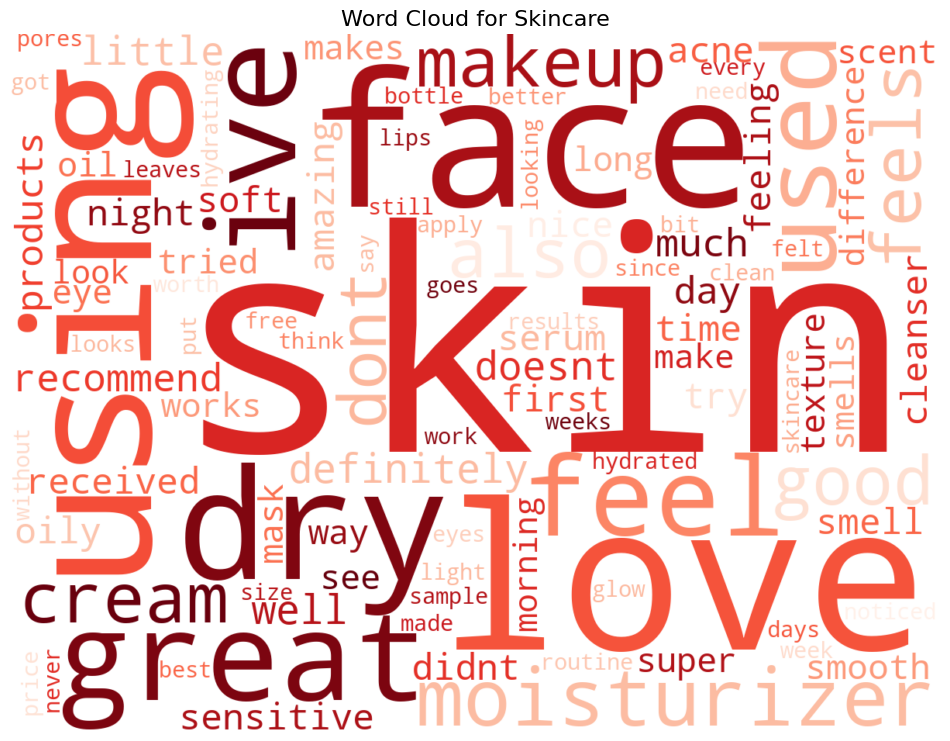

In [23]:
# Handle SSL certificate verification issues (as before)
try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context

# Download NLTK resources (as before)
def ensure_nltk_resources():
    try:
        nltk.data.find('tokenizers/punkt')
    except LookupError:
        try:
            nltk.download('punkt')
        except Exception as e:
            print(f"Error downloading punkt: {e}")
            return False

    try:
        nltk.data.find('stopwords')
    except LookupError:
        try:
            nltk.download('stopwords')
        except Exception as e:
            print(f"Error downloading stopwords: {e}")
            return False

    try:
        nltk.data.find('wordnet')
    except LookupError:
        try:
            nltk.download('wordnet')
        except Exception as e:
            print(f"Error downloading wordnet: {e}")
            return False
    return True

if not ensure_nltk_resources():
    print("Failed to download NLTK resources. Word cloud generation may not work.")

# Define a function to generate word clouds for each category
def generate_wordclouds_by_category(
    df,
    text_column='review_text',
    category_column='primary_category',
    max_words=100,
    figure_size=(12, 10),
):
    """Generates and displays word clouds for each category."""

    stop_words = set(stopwords.words('english'))
    additional_stop_words = {
        'product',
        'use',
        'one',
        'like',
        'get',
        'would',
        'really',
        'even',
    }
    stop_words.update(additional_stop_words)

    categories = df[category_column].unique()

    for category in categories:
        category_df = df[df[category_column] == category]
        text = ' '.join(category_df[text_column].astype(str))
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        tokens = word_tokenize(text)
        tokens = [
            word.lower()
            for word in tokens
            if word.lower() not in stop_words and len(word) > 2
        ]
        word_counts = Counter(tokens)

        try:
            wordcloud = WordCloud(
                width=1200,
                height=900,
                background_color='white',
                max_words=max_words,
                colormap='Reds',  # Changed to 'Reds'
                collocations=False,
            ).generate_from_frequencies(word_counts)

            plt.figure(figsize=figure_size)
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f'Word Cloud for {category}', fontsize=16)
            plt.axis('off')
            plt.show()

        except ValueError as e:
            print(f"ValueError for category '{category}': {e}")
            print("Skipping this category.")


# Example usage:
generate_wordclouds_by_category(reviews_df)

## Clean data and store it in different files
Now that we analysed and compared the data of the products in different categories, we can finally clean the data and keep only the category that we have reviews for: skincare.

In [24]:
def save_data_for_skincare_analysis(
    product_info_df, reviews_df, output_path="./data/"
):
    """
    Saves the product_info_df and reviews_df to CSV files,
    filtering product_info_df to include only 'Skincare' category products.

    Args:
        product_info_df (pd.DataFrame): DataFrame containing product information.
        reviews_df (pd.DataFrame): DataFrame containing review information.
        output_path (str, optional): Directory path to save the CSV files.
                                     Defaults to "./data/".
    """

    # 1. Filter product_info_df
    skincare_product_info_df = product_info_df[
        product_info_df["primary_category"] == "Skincare"
    ].copy()

    # 2. Create the output directory if it doesn't exist
    import os

    os.makedirs(output_path, exist_ok=True)

    # 3. Save to CSV
    skincare_product_info_df.to_csv(
        os.path.join(output_path, "skincare_product_info.csv"), index=False
    )
    reviews_df.to_csv(os.path.join(output_path, "reviews.csv"), index=False)

    print(
        f"Saved skincare_product_info.csv and reviews.csv to the directory: {output_path}"
    )


save_data_for_skincare_analysis(product_info_df, reviews_df, output_path="../data/processed/")

Saved skincare_product_info.csv and reviews.csv to the directory: ../data/processed/


# Future work 💄
Data (reviews) for the other categories can be obtained in the same format by using the sephora API, but for now we will only work on the skincare category for a multitude of reasons:
- It takes time to obtain a key for the API
- The data needs to be cleaned properly (it has many other caracteristics and it is in a very different format)
- The skincare category proves that the recommendation system can be scaled to other categories
- We lack the computational resources for this (even now we have over a million reviews with about 100 words each)